# Flood Detection and Impact Analysis with NDWI

In this notebook, we'll analyze a real flood event using the **NDWI (Normalized Difference Water Index)**.

**What we'll discover:**
1. NDWI directly detects water presence
2. Comparing pre/post flood NDWI reveals **flood extent**
3. We can also check NDVI to see **vegetation damage** from flooding

**Why this matters:**
- Emergency responders need to know which areas are underwater
- Agricultural agencies need to assess crop damage
- Insurance companies need objective flood extent mapping
- Urban planners need to understand flood-prone areas

---
## 1. Setup

In [22]:
from pystac_client import Client
import planetary_computer as pc
from odc.stac import stac_load

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.patches as mpatches
import warnings
warnings.filterwarnings('ignore')

catalog = Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")
print("Connected to Planetary Computer")

Connected to Planetary Computer


---
## 2. Understanding NDWI

**NDWI (Normalized Difference Water Index)** detects water bodies:

$$NDWI = \frac{Green - NIR}{Green + NIR}$$

**Why it works:**
- Water **absorbs** NIR light strongly → low NIR reflectance
- Water **reflects** green light moderately → moderate green reflectance
- Result: Water has **positive NDWI** (typically > 0)
- Land has **negative NDWI** (vegetation reflects NIR strongly)

| NDWI Value | Interpretation |
|------------|----------------|
| > 0.3 | Open water |
| 0.0 to 0.3 | Wet/flooded areas, shallow water |
| -0.3 to 0.0 | Moist soil, sparse vegetation |
| < -0.3 | Dry land, dense vegetation |

---
## 3. Select a Flood Event

We'll analyze the **2024 Brazil Floods** in Rio Grande do Sul — catastrophic flooding that affected millions of people.

- **When:** Late April - May 2024
- **Where:** Rio Grande do Sul, southern Brazil
- **Impact:** Over 2 million people affected, widespread devastation

We'll compare imagery from **before** (March 2024) and **during/after** (May 2024) the floods.

In [23]:
# 2024 Brazil Floods - Rio Grande do Sul
# Area around Porto Alegre and Guaíba Lake
event_name = "2024 Brazil Floods, Rio Grande do Sul"
bbox = [-51.30, -30.15, -51.10, -29.95]  # Area near Porto Alegre

# Time periods
pre_flood_date = "2024-03-01/2024-03-31"   # Before floods
post_flood_date = "2024-05-01/2024-05-31"  # During/after major flooding

print(f"Event: {event_name}")
print(f"Pre-flood period:  {pre_flood_date}")
print(f"Post-flood period: {post_flood_date}")

Event: 2024 Brazil Floods, Rio Grande do Sul
Pre-flood period:  2024-03-01/2024-03-31
Post-flood period: 2024-05-01/2024-05-31


---
## 4. Helper Functions

In [24]:
def normalize_for_display(img, pmin=2, pmax=98):
    """Normalize image to 0-1 range for display."""
    lo, hi = np.nanpercentile(img, [pmin, pmax])
    return np.clip((img - lo) / (hi - lo + 1e-6), 0, 1)

def compute_ndwi(green, nir):
    """Compute Normalized Difference Water Index: (Green - NIR) / (Green + NIR)"""
    green = green.astype('float32')
    nir = nir.astype('float32')
    return (green - nir) / (green + nir + 1e-6)

def compute_ndvi(nir, red):
    """Compute Normalized Difference Vegetation Index: (NIR - Red) / (NIR + Red)"""
    nir = nir.astype('float32')
    red = red.astype('float32')
    return (nir - red) / (nir + red + 1e-6)

def load_image(catalog, bbox, date_range, max_cloud=30):
    """Load a Sentinel-2 image for the given location and date range."""
    search = catalog.search(
        collections=["sentinel-2-l2a"],
        bbox=bbox,
        datetime=date_range,
        query={"eo:cloud_cover": {"lt": max_cloud}},
    )
    items = list(search.items())
    
    if len(items) == 0:
        print(f"  No images with <{max_cloud}% clouds. Trying with <50% clouds...")
        search = catalog.search(
            collections=["sentinel-2-l2a"],
            bbox=bbox,
            datetime=date_range,
            query={"eo:cloud_cover": {"lt": 50}},
        )
        items = list(search.items())
    
    if len(items) == 0:
        raise ValueError(f"No images found for {date_range}")
    
    # Get clearest image
    items_sorted = sorted(items, key=lambda x: x.properties.get('eo:cloud_cover', 100))
    item = items_sorted[0]
    
    signed_item = pc.sign(item)
    data = stac_load(
        [signed_item],
        bands=["B02", "B03", "B04", "B08"],  # Blue, Green, Red, NIR
        bbox=bbox,
        crs="EPSG:4326",
        resolution=0.0002,
        groupby="solar_day",
    )
    
    return data, item

print("Helper functions defined.")

Helper functions defined.


---
## 5. Load Pre-Flood and Post-Flood Images

In [25]:
print("Loading pre-flood image...")
pre_data, pre_item = load_image(catalog, bbox, pre_flood_date)
print(f"  Date: {pre_item.datetime.strftime('%Y-%m-%d')}")
print(f"  Cloud cover: {pre_item.properties.get('eo:cloud_cover', 0):.1f}%")
print(f"  Data dimensions: {dict(pre_data.dims)}")

print("\nLoading post-flood image...")
post_data, post_item = load_image(catalog, bbox, post_flood_date)
print(f"  Date: {post_item.datetime.strftime('%Y-%m-%d')}")
print(f"  Cloud cover: {post_item.properties.get('eo:cloud_cover', 0):.1f}%")
print(f"  Data dimensions: {dict(post_data.dims)}")

# Show the bbox we're using
lon_range = bbox[2] - bbox[0]
lat_range = bbox[3] - bbox[1]
print(f"\nBbox: {bbox}")
print(f"  Longitude range: {lon_range:.4f}° ({lon_range*85:.1f} km at this latitude)")
print(f"  Latitude range: {lat_range:.4f}° ({lat_range*111:.1f} km)")

Loading pre-flood image...
  Date: 2024-03-24
  Cloud cover: 0.0%
  Data dimensions: {'latitude': 1000, 'longitude': 1000, 'time': 1}

Loading post-flood image...
  Date: 2024-05-21
  Cloud cover: 4.1%
  Data dimensions: {'latitude': 1000, 'longitude': 1000, 'time': 1}

Bbox: [-51.3, -30.15, -51.1, -29.95]
  Longitude range: 0.2000° (17.0 km at this latitude)
  Latitude range: 0.2000° (22.2 km)


---
## 6. Extract Bands and Create Composites

In [26]:
# Extract bands for pre-flood
pre_red = pre_data["B04"].isel(time=0).values
pre_green = pre_data["B03"].isel(time=0).values
pre_blue = pre_data["B02"].isel(time=0).values
pre_nir = pre_data["B08"].isel(time=0).values

# Extract bands for post-flood
post_red = post_data["B04"].isel(time=0).values
post_green = post_data["B03"].isel(time=0).values
post_blue = post_data["B02"].isel(time=0).values
post_nir = post_data["B08"].isel(time=0).values

# Create RGB composites
pre_rgb = normalize_for_display(np.stack([pre_red, pre_green, pre_blue], axis=-1))
post_rgb = normalize_for_display(np.stack([post_red, post_green, post_blue], axis=-1))

# Check the shape
print(f"Image shape: {pre_rgb.shape}")
print(f"  Height (rows): {pre_rgb.shape[0]}")
print(f"  Width (cols): {pre_rgb.shape[1]}")

img_height, img_width = pre_rgb.shape[:2]
aspect_ratio = img_width / img_height
print(f"  Aspect ratio (w/h): {aspect_ratio:.2f}")

Image shape: (1000, 1000, 3)
  Height (rows): 1000
  Width (cols): 1000
  Aspect ratio (w/h): 1.00


---
## 7. True Color Comparison

First, let's see what human eyes can observe.

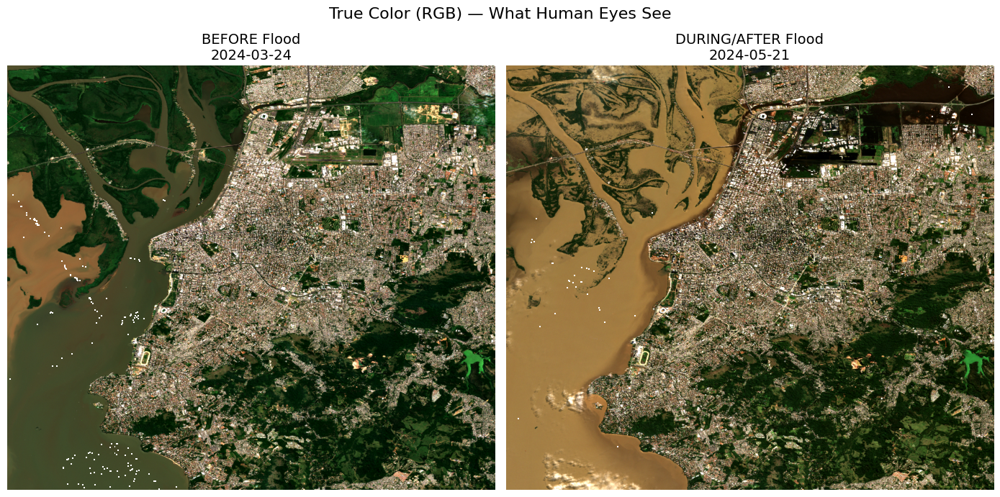

In [27]:
# Figure size based on image aspect ratio
img_height, img_width = pre_rgb.shape[:2]
aspect_ratio = img_width / img_height

subplot_width = 7
subplot_height = subplot_width / aspect_ratio
fig, axes = plt.subplots(1, 2, figsize=(subplot_width * 2, subplot_height))

axes[0].imshow(pre_rgb, aspect='auto')
axes[0].set_title(f"BEFORE Flood\n{pre_item.datetime.strftime('%Y-%m-%d')}", fontsize=14)
axes[0].axis('off')

axes[1].imshow(post_rgb, aspect='auto')
axes[1].set_title(f"DURING/AFTER Flood\n{post_item.datetime.strftime('%Y-%m-%d')}", fontsize=14)
axes[1].axis('off')

plt.suptitle("True Color (RGB) — What Human Eyes See", fontsize=16)
plt.tight_layout()
plt.show()

### What can you see in true color?

You might notice:
- More **brown/murky areas** in the flood image
- Some obvious water expansion

But can you precisely tell:
- The **exact boundary** of flooded areas?
- Which fields are **partially flooded** vs completely submerged?
- The **total flooded area** in hectares?

That's where NDWI comes in.

---
## 8. Compute NDWI (Water Detection)

In [28]:
# Compute NDWI for both dates
pre_ndwi = compute_ndwi(pre_green, pre_nir)
post_ndwi = compute_ndwi(post_green, post_nir)

print(f"Pre-flood NDWI:  min={np.nanmin(pre_ndwi):.2f}, max={np.nanmax(pre_ndwi):.2f}, mean={np.nanmean(pre_ndwi):.2f}")
print(f"Post-flood NDWI: min={np.nanmin(post_ndwi):.2f}, max={np.nanmax(post_ndwi):.2f}, mean={np.nanmean(post_ndwi):.2f}")

# Count water pixels (NDWI > 0)
pre_water_pct = 100 * np.sum(pre_ndwi > 0) / pre_ndwi.size
post_water_pct = 100 * np.sum(post_ndwi > 0) / post_ndwi.size
print(f"\nWater coverage (NDWI > 0):")
print(f"  Pre-flood:  {pre_water_pct:.1f}%")
print(f"  Post-flood: {post_water_pct:.1f}%")
print(f"  Increase:   {post_water_pct - pre_water_pct:.1f} percentage points")

Pre-flood NDWI:  min=-0.65, max=0.56, mean=-0.24
Post-flood NDWI: min=-0.68, max=0.52, mean=-0.16

Water coverage (NDWI > 0):
  Pre-flood:  22.1%
  Post-flood: 30.6%
  Increase:   8.6 percentage points


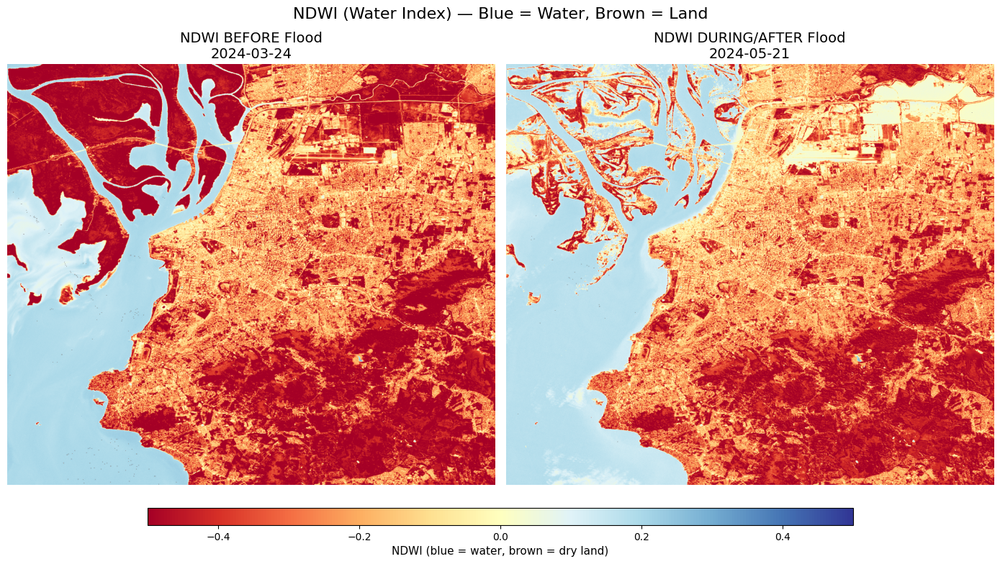

In [29]:
# Figure size based on aspect ratio
img_height, img_width = pre_ndwi.shape
aspect_ratio = img_width / img_height

subplot_width = 7
subplot_height = subplot_width / aspect_ratio
fig, axes = plt.subplots(1, 2, figsize=(subplot_width * 2, subplot_height + 1))

# Use a water-focused colormap: blue for water, brown for land
im0 = axes[0].imshow(pre_ndwi, cmap='RdYlBu', vmin=-0.5, vmax=0.5, aspect='auto')
axes[0].set_title(f"NDWI BEFORE Flood\n{pre_item.datetime.strftime('%Y-%m-%d')}", fontsize=14)
axes[0].axis('off')

im1 = axes[1].imshow(post_ndwi, cmap='RdYlBu', vmin=-0.5, vmax=0.5, aspect='auto')
axes[1].set_title(f"NDWI DURING/AFTER Flood\n{post_item.datetime.strftime('%Y-%m-%d')}", fontsize=14)
axes[1].axis('off')

plt.suptitle("NDWI (Water Index) — Blue = Water, Brown = Land", fontsize=16)
plt.tight_layout()

cbar_ax = fig.add_axes([0.15, 0.08, 0.7, 0.03])
cbar = fig.colorbar(im1, cax=cbar_ax, orientation='horizontal')
cbar.set_label('NDWI (blue = water, brown = dry land)', fontsize=11)
plt.subplots_adjust(bottom=0.15)
plt.show()

### What NDWI reveals:

Notice in the post-flood NDWI:
- **More blue areas** — expanded water extent
- **Clearer boundaries** — can see exactly where water reached
- **Gradient of wetness** — light blue = shallow/wet, dark blue = deep water

---
## 9. Compute Flood Extent (dNDWI)

Similar to dNBR for fires, we can compute the **difference** in NDWI:

$$dNDWI = NDWI_{post} - NDWI_{pre}$$

**Interpretation:**
- **High positive dNDWI:** Area became wetter → **newly flooded**
- **Near zero:** No change in water status
- **Negative dNDWI:** Area became drier (unusual during floods)

In [30]:
# Compute dNDWI (change in water index)
dndwi = post_ndwi - pre_ndwi

print(f"dNDWI statistics:")
print(f"  Min: {np.nanmin(dndwi):.2f}")
print(f"  Max: {np.nanmax(dndwi):.2f}")
print(f"  Mean: {np.nanmean(dndwi):.2f}")

# Count newly flooded pixels (significant increase in NDWI)
flooded_pixels = np.sum(dndwi > 0.1)  # Threshold for "newly wet"
total_pixels = dndwi.size
print(f"\nNewly flooded area (dNDWI > 0.1): {100 * flooded_pixels / total_pixels:.1f}% of image")

dNDWI statistics:
  Min: -0.64
  Max: 0.82
  Mean: 0.08

Newly flooded area (dNDWI > 0.1): 18.5% of image


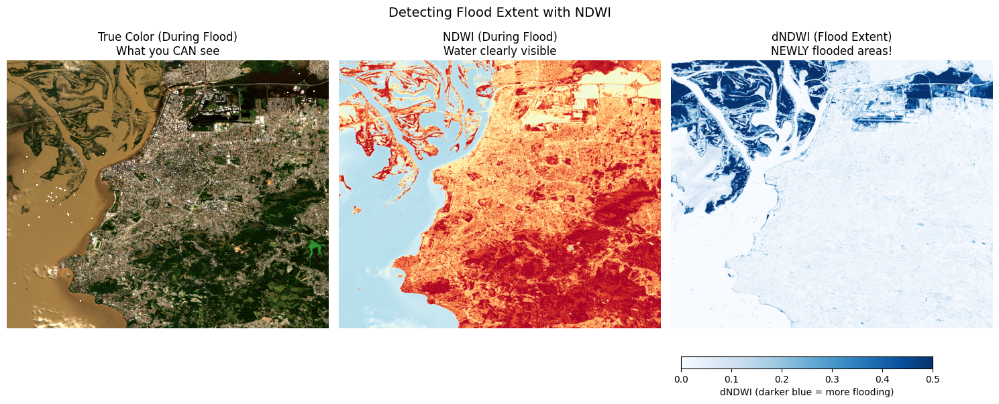

In [31]:
# Figure size for 3 subplots
img_height, img_width = dndwi.shape
aspect_ratio = img_width / img_height

subplot_width = 5
subplot_height = subplot_width / aspect_ratio
fig, axes = plt.subplots(1, 3, figsize=(subplot_width * 3, subplot_height + 1))

# True color post-flood
axes[0].imshow(post_rgb, aspect='auto')
axes[0].set_title("True Color (During Flood)\nWhat you CAN see", fontsize=12)
axes[0].axis('off')

# NDWI post-flood
im1 = axes[1].imshow(post_ndwi, cmap='RdYlBu', vmin=-0.5, vmax=0.5, aspect='auto')
axes[1].set_title("NDWI (During Flood)\nWater clearly visible", fontsize=12)
axes[1].axis('off')

# dNDWI - flood extent
im2 = axes[2].imshow(dndwi, cmap='Blues', vmin=0, vmax=0.5, aspect='auto')
axes[2].set_title("dNDWI (Flood Extent)\nNEWLY flooded areas!", fontsize=12)
axes[2].axis('off')

plt.suptitle("Detecting Flood Extent with NDWI", fontsize=14)
plt.tight_layout()

cbar_ax = fig.add_axes([0.68, 0.08, 0.25, 0.03])
cbar = fig.colorbar(im2, cax=cbar_ax, orientation='horizontal')
cbar.set_label('dNDWI (darker blue = more flooding)', fontsize=10)
plt.subplots_adjust(bottom=0.18)
plt.show()

---
## 10. Classify Flood Impact

In [32]:
def classify_flood_status(pre_ndwi, post_ndwi):
    """
    Classify flood status based on NDWI values.
    Returns integer classes:
    0 = Permanent water (water before and after)
    1 = Flooded (was land, now water)
    2 = Wet/saturated (increased wetness but not fully submerged)
    3 = Dry land (no flooding)
    """
    status = np.zeros_like(pre_ndwi, dtype=np.int8)
    
    # Thresholds
    water_threshold = 0.0  # NDWI > 0 indicates water
    
    # Permanent water: was water before, still water
    status[(pre_ndwi > water_threshold) & (post_ndwi > water_threshold)] = 0
    
    # Flooded: was land (NDWI < 0), now water (NDWI > 0)
    status[(pre_ndwi <= water_threshold) & (post_ndwi > water_threshold)] = 1
    
    # Wet/saturated: significant increase in NDWI but not fully flooded
    dndwi = post_ndwi - pre_ndwi
    status[(pre_ndwi <= water_threshold) & (post_ndwi <= water_threshold) & (dndwi > 0.15)] = 2
    
    # Dry land: everything else
    status[(pre_ndwi <= water_threshold) & (post_ndwi <= water_threshold) & (dndwi <= 0.15)] = 3
    
    return status

flood_map = classify_flood_status(pre_ndwi, post_ndwi)

# Count pixels in each class
print("Flood Classification:")
print("-" * 50)
flood_names = ['Permanent Water', 'Flooded', 'Wet/Saturated', 'Dry Land']
for i, name in enumerate(flood_names):
    count = np.sum(flood_map == i)
    pct = 100 * count / flood_map.size
    print(f"  {name:18s}: {pct:5.1f}% of area")

Flood Classification:
--------------------------------------------------
  Permanent Water   :  22.1% of area
  Flooded           :   8.8% of area
  Wet/Saturated     :   6.4% of area
  Dry Land          :  62.8% of area


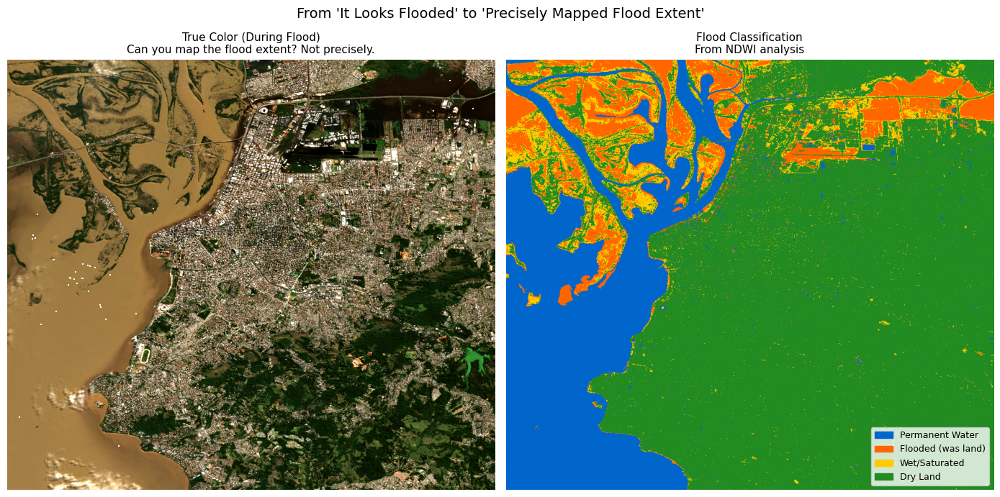

In [33]:
# Create a custom colormap for flood classes
colors = ['#0066CC', '#FF6600', '#FFCC00', '#228B22']  # Blue, Orange, Yellow, Green
cmap_flood = ListedColormap(colors)
bounds = [-0.5, 0.5, 1.5, 2.5, 3.5]
norm = BoundaryNorm(bounds, cmap_flood.N)

# Figure size based on aspect ratio
img_height, img_width = flood_map.shape
aspect_ratio = img_width / img_height

subplot_width = 7
subplot_height = subplot_width / aspect_ratio
fig, axes = plt.subplots(1, 2, figsize=(subplot_width * 2, subplot_height))

# True color
axes[0].imshow(post_rgb, aspect='auto')
axes[0].set_title("True Color (During Flood)\nCan you map the flood extent? Not precisely.", fontsize=11)
axes[0].axis('off')

# Classified flood map
im = axes[1].imshow(flood_map, cmap=cmap_flood, norm=norm, aspect='auto')
axes[1].set_title("Flood Classification\nFrom NDWI analysis", fontsize=11)
axes[1].axis('off')

# Add legend
patches = [
    mpatches.Patch(color=colors[0], label='Permanent Water'),
    mpatches.Patch(color=colors[1], label='Flooded (was land)'),
    mpatches.Patch(color=colors[2], label='Wet/Saturated'),
    mpatches.Patch(color=colors[3], label='Dry Land'),
]
axes[1].legend(handles=patches, loc='lower right', fontsize=9)

plt.suptitle("From 'It Looks Flooded' to 'Precisely Mapped Flood Extent'", fontsize=14)
plt.tight_layout()
plt.show()

---
## 11. Flood Impact Report

In [34]:
# Calculate approximate areas
pixel_area_hectares = 0.04  # Approximate hectares per pixel at this resolution

print("="*60)
print("FLOOD IMPACT REPORT")
print("="*60)
print(f"Event: {event_name}")
print(f"Pre-flood date:  {pre_item.datetime.strftime('%Y-%m-%d')}")
print(f"Post-flood date: {post_item.datetime.strftime('%Y-%m-%d')}")
print("="*60)
print("\nFlood Status Breakdown:")
print("-"*60)

actions = [
    "Normal water body - no action needed",
    "FLOODED - evacuation/rescue may be needed",
    "Saturated soil - monitor for further flooding",
    "Unaffected - no immediate action"
]

for i, name in enumerate(flood_names):
    count = np.sum(flood_map == i)
    pct = 100 * count / flood_map.size
    area = count * pixel_area_hectares
    
    print(f"\n{name}:")
    print(f"  Coverage: {pct:.1f}% (~{area:.0f} hectares)")
    print(f"  Action:   {actions[i]}")

print("\n" + "="*60)
print("This report was generated automatically from satellite data.")
print("NDWI analysis provides objective flood extent mapping.")
print("="*60)

FLOOD IMPACT REPORT
Event: 2024 Brazil Floods, Rio Grande do Sul
Pre-flood date:  2024-03-24
Post-flood date: 2024-05-21

Flood Status Breakdown:
------------------------------------------------------------

Permanent Water:
  Coverage: 22.1% (~8829 hectares)
  Action:   Normal water body - no action needed

Flooded:
  Coverage: 8.8% (~3517 hectares)
  Action:   FLOODED - evacuation/rescue may be needed

Wet/Saturated:
  Coverage: 6.4% (~2544 hectares)
  Action:   Saturated soil - monitor for further flooding

Dry Land:
  Coverage: 62.8% (~25111 hectares)
  Action:   Unaffected - no immediate action

This report was generated automatically from satellite data.
NDWI analysis provides objective flood extent mapping.


---
## 12. Bonus: Check Vegetation Impact with NDVI

Floods don't just cover land — they damage vegetation. Let's check NDVI to see the agricultural impact.

In [35]:
# Compute NDVI for both dates
pre_ndvi = compute_ndvi(pre_nir, pre_red)
post_ndvi = compute_ndvi(post_nir, post_red)

# NDVI change (negative = vegetation loss)
dndvi = post_ndvi - pre_ndvi

print(f"NDVI Statistics:")
print(f"  Pre-flood mean NDVI:  {np.nanmean(pre_ndvi):.2f}")
print(f"  Post-flood mean NDVI: {np.nanmean(post_ndvi):.2f}")
print(f"  Change in NDVI:       {np.nanmean(dndvi):.2f}")

# Significant vegetation loss
veg_loss_pct = 100 * np.sum(dndvi < -0.2) / dndvi.size
print(f"\nArea with significant vegetation loss (dNDVI < -0.2): {veg_loss_pct:.1f}%")

NDVI Statistics:
  Pre-flood mean NDVI:  0.25
  Post-flood mean NDVI: 0.15
  Change in NDVI:       -0.10

Area with significant vegetation loss (dNDVI < -0.2): 13.9%


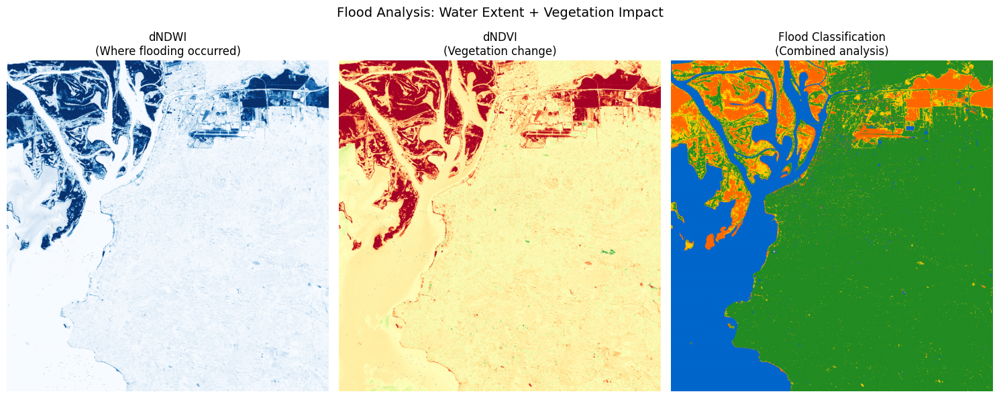

In [36]:
# Figure size for comparison
img_height, img_width = dndvi.shape
aspect_ratio = img_width / img_height

subplot_width = 5
subplot_height = subplot_width / aspect_ratio
fig, axes = plt.subplots(1, 3, figsize=(subplot_width * 3, subplot_height + 1))

# NDWI change (flood extent)
im0 = axes[0].imshow(dndwi, cmap='Blues', vmin=0, vmax=0.5, aspect='auto')
axes[0].set_title("dNDWI\n(Where flooding occurred)", fontsize=12)
axes[0].axis('off')

# NDVI change (vegetation damage)
im1 = axes[1].imshow(dndvi, cmap='RdYlGn', vmin=-0.5, vmax=0.5, aspect='auto')
axes[1].set_title("dNDVI\n(Vegetation change)", fontsize=12)
axes[1].axis('off')

# Flood classification
im2 = axes[2].imshow(flood_map, cmap=cmap_flood, norm=norm, aspect='auto')
axes[2].set_title("Flood Classification\n(Combined analysis)", fontsize=12)
axes[2].axis('off')

plt.suptitle("Flood Analysis: Water Extent + Vegetation Impact", fontsize=14)
plt.tight_layout()
plt.show()

---
## Summary: NDWI for Flood Detection

### What we learned:

| Index | Formula | What it detects |
|-------|---------|------------------|
| **NDWI** | (Green - NIR) / (Green + NIR) | Water presence |
| **dNDWI** | NDWI_post - NDWI_pre | Newly flooded areas |
| **NDVI** | (NIR - Red) / (NIR + Red) | Vegetation health |
| **dNDVI** | NDVI_post - NDVI_pre | Vegetation damage |

### Real-world applications:

| Application | How NDWI helps |
|-------------|----------------|
| Emergency response | Map flood extent for evacuation routes |
| Agriculture | Assess crop damage for insurance claims |
| Urban planning | Identify flood-prone areas for zoning |
| Insurance | Objective damage assessment |
| Climate research | Track flooding patterns over time |

### Key insight:
Just like with wildfires, spectral indices turn "I can see flooding" into "I can **measure** exactly where and how much flooding occurred."